In [1]:
#标准库导入
import re
import string
from collections import Counter,namedtuple

In [2]:
#numpy、pandas和爬虫库导入
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup

In [3]:
#数据预处理和机器学习算法模型导入
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [4]:
#数据可视化库导入
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

In [5]:
def scrape_shakespeare(SHAKESPEARE_URL):
    """
    从指定的网页扒取莎士比亚剧作文本，最终返回结果包括剧作名称、体裁、角色、场景、幕、台词标号和台词内容
    """
    session = requests.Session()
    #获取并解析首页内容
    homepage = session.get(SHAKESPEARE_URL)
    soup = BeautifulSoup(homepage.content, "html.parser")
    Line = namedtuple('Line', ['play_name', 'genre', 'character', 'act', 'scene', 'sentence', 'text'])

    texts = []
    #网页中体裁和剧作名称都存放在table中
    main_table = soup.find_all('table')[1]
    #获取作品类型和该类作品列表
    genres = [td.text.strip() for td in main_table.find_all('tr')[0].find_all('td') if td.text.strip() != 'Poetry']
    plays = main_table.find_all('tr')[1].find_all('td')

    for genre, play_td in zip(genres, plays):#依照作品类型依次遍历作品列表
        for link in play_td.find_all('a'):
            play_name = link.text.strip()
            #获取并解析详细内容
            play_url = f"{SHAKESPEARE_URL}/{link['href'].replace('index', 'full')}"
            play_page = session.get(play_url)
            play_soup = BeautifulSoup(play_page.content, "html.parser")

            # 提出角色和其他素材信息
            for tag in play_soup.find_all('a', {'name': re.compile('speech.*')}):
                #从解析后的详情内容中获取信息
                character = tag.text.title().strip()
                speech_block = tag.find_next_sibling('blockquote')
                if speech_block:
                    for sentence_tag in speech_block.find_all('a'):
                        act, scene, sentence_id = sentence_tag['name'].split('.')
                        text = sentence_tag.text.strip()
                        texts.append(Line(play_name, genre, character, act, scene, sentence_id, text))
    return pd.DataFrame(texts)

In [6]:
SHAKESPEARE_URL = 'http://shakespeare.mit.edu/'
df=scrape_shakespeare(SHAKESPEARE_URL)
df.to_excel('shakespeare.xlsx',index=False)

In [5]:
df=pd.read_excel("shakespeare.xlsx")

In [6]:
df.head()

,play_name,genre,character,act,scene,sentence,text
0,All's Well That Ends Well,Comedy,Countess,1,1,1,"In delivering my son from me, I bury a second ..."
1,All's Well That Ends Well,Comedy,Bertram,1,1,2,"And I in going, madam, weep o'er my father's d..."
2,All's Well That Ends Well,Comedy,Bertram,1,1,3,"anew: but I must attend his majesty's command, to"
3,All's Well That Ends Well,Comedy,Bertram,1,1,4,"whom I am now in ward, evermore in subjection."
4,All's Well That Ends Well,Comedy,Lafeu,1,1,5,"You shall find of the king a husband, madam; you,"


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108093 entries, 0 to 108092
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   play_name  108093 non-null  object
 1   genre      108093 non-null  object
 2   character  108093 non-null  object
 3   act        108093 non-null  int64 
 4   scene      108093 non-null  int64 
 5   sentence   108093 non-null  int64 
 6   text       108093 non-null  object
dtypes: int64(3), object(4)
memory usage: 5.8+ MB


In [8]:
#扒取莎士比亚剧作中女性角色的信息
def scrape_female_shakespeare():
    session=requests.Session()
    page=session.get("http://www.degolmovie.com/liveshakespeare/allplaysfemalecharacters.htm")
    soup=BeautifulSoup(page.content,"html.parser")
    FemaleCharacter=namedtuple('FemaleCharacter',['character','sex'])
    female_shakespeare=[FemaleCharacter(x.text.strip(),'female') for x in soup.find_all('table')[4].find('tr').find_all('a')]
    return pd.DataFrame(female_shakespeare).drop_duplicates()

In [9]:
df_sex=scrape_female_shakespeare()
df_sex.to_excel("sex.xlsx",index=False)

In [10]:
df_sex.head()

,character,sex
0,Adriana,female
1,Aemelia,female
2,Alice,female
3,All Ladies,female
4,Andromache,female


In [11]:
#整合莎士比亚剧作文本信息和角色的性别信息
data=df.merge(df_sex,on='character',how='left')
data['sex']=data['sex'].fillna('male')
data.head()

,play_name,genre,character,act,scene,sentence,text,sex
0,All's Well That Ends Well,Comedy,Countess,1,1,1,"In delivering my son from me, I bury a second ...",female
1,All's Well That Ends Well,Comedy,Bertram,1,1,2,"And I in going, madam, weep o'er my father's d...",male
2,All's Well That Ends Well,Comedy,Bertram,1,1,3,"anew: but I must attend his majesty's command, to",male
3,All's Well That Ends Well,Comedy,Bertram,1,1,4,"whom I am now in ward, evermore in subjection.",male
4,All's Well That Ends Well,Comedy,Lafeu,1,1,5,"You shall find of the king a husband, madam; you,",male


In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108093 entries, 0 to 108092
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   play_name  108093 non-null  object
 1   genre      108093 non-null  object
 2   character  108093 non-null  object
 3   act        108093 non-null  int64 
 4   scene      108093 non-null  int64 
 5   sentence   108093 non-null  int64 
 6   text       108093 non-null  object
 7   sex        108093 non-null  object
dtypes: int64(3), object(5)
memory usage: 6.6+ MB


In [13]:
genre_group_data=data.groupby('genre').nunique()
genre_group_data

,play_name,character,act,scene,sentence,text,sex
genre,,,,,,,
Comedy,17,380,6,10,971,45264,2
History,10,344,6,11,609,30525,2
Tragedy,10,334,5,16,616,31125,2


In [14]:
#将同一题材、同一剧作、同一场景下同一人物的台词进行整合
texts=data.groupby(['play_name','genre','act','character','sex'])['text'].apply(lambda x:' '.join(x))
display(texts)

play_name                  genre   act  character         sex   
A Midsummer Night's Dream  Comedy  1    All               male                That would hang us, every mother's son.
                                        Bottom            male      You were best to call them generally, man by m...
                                        Demetrius         male      Relent, sweet Hermia: and, Lysander, yield Thy...
                                        Egeus             male      Happy be Theseus, our renowned duke! Full of v...
                                        Flute             male      Here, Peter Quince. What is Thisby? a wanderin...
                                                                                          ...                        
Winter's Tale              Comedy  5    Perdita           female    O my poor father! The heaven sets spies upon u...
                                        Polixenes         male      O, not by much. Dear my brother, Let him 

In [15]:
#整合莎士比亚剧作中所有体裁和作品的台词
all_text=' '.join(data['text'])
all_text

"In delivering my son from me, I bury a second husband. And I in going, madam, weep o'er my father's death anew: but I must attend his majesty's command, to whom I am now in ward, evermore in subjection. You shall find of the king a husband, madam; you, sir, a father: he that so generally is at all times good must of necessity hold his virtue to you; whose worthiness would stir it up where it wanted rather than lack it where there is such abundance. What hope is there of his majesty's amendment? He hath abandoned his physicians, madam; under whose practises he hath persecuted time with hope, and finds no other advantage in the process but only the losing of hope by time. This young gentlewoman had a father,--O, that 'had'! how sad a passage 'tis!--whose skill was almost as great as his honesty; had it stretched so far, would have made nature immortal, and death should have play for lack of work. Would, for the king's sake, he were living! I think it would be the death of the king's dis

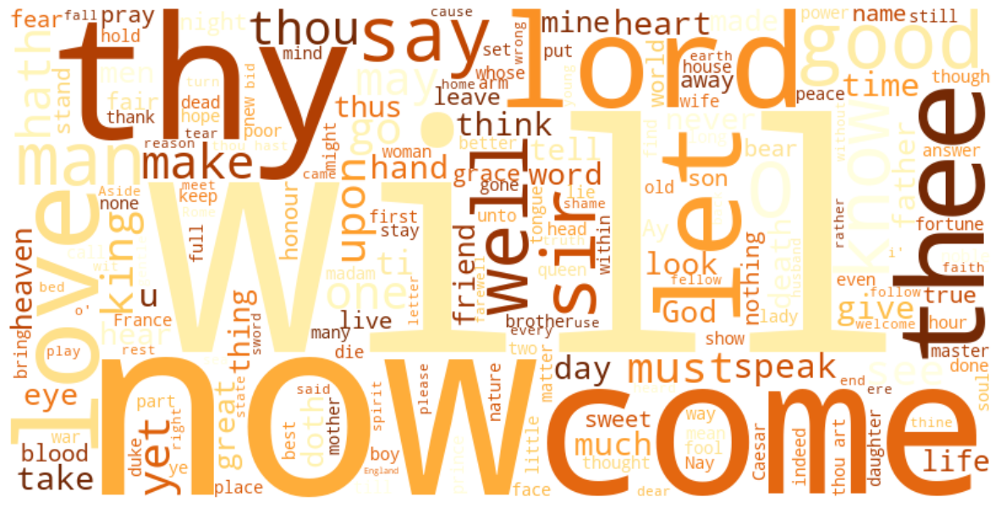

In [16]:
#通过词云图的方式呈现所有台词中词频较高的单词
wordcloud = WordCloud(width=800, height=400, colormap='YlOrBr',
                      background_color='white', stopwords=set(STOPWORDS)
                     ).generate(all_text)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [17]:
#统计莎士比亚所有剧作中各角色的总计出现次数
character_counts = Counter(df['character'])
character_counts 

Counter({'Gloucester': 1824,
         'Falstaff': 1764,
         'Hamlet': 1495,
         'King Henry V': 1130,
         'Iago': 1098,
         'Brutus': 975,
         'Othello': 887,
         'King Henry Vi': 865,
         'Duke Vincentio': 851,
         'Mark Antony': 851,
         'Timon': 824,
         'Queen Margaret': 814,
         'Prince Henry': 777,
         'Clown': 761,
         'King Richard Ii': 758,
         'King Lear': 752,
         'Warwick': 735,
         'Titus Andronicus': 722,
         'Macbeth': 718,
         'Helena': 702,
         'Prospero': 695,
         'York': 693,
         'Leontes': 692,
         'Cleopatra': 686,
         'Portia': 681,
         'Coriolanus': 680,
         'Rosalind': 677,
         'King Henry Iv': 664,
         'Buckingham': 632,
         'Romeo': 612,
         'Pericles': 609,
         'Imogen': 605,
         'Biron': 599,
         'Menenius': 589,
         'Petruchio': 587,
         'Hotspur': 562,
         'Suffolk': 560,
         'Ju

In [18]:
#提取总出现次数排名前10的角色名称
character_counts = Counter(df['character'])
most_character_counts = character_counts.most_common(10)
most_character_counts

[('Gloucester', 1824),
 ('Falstaff', 1764),
 ('Hamlet', 1495),
 ('King Henry V', 1130),
 ('Iago', 1098),
 ('Brutus', 975),
 ('Othello', 887),
 ('King Henry Vi', 865),
 ('Duke Vincentio', 851),
 ('Mark Antony', 851)]

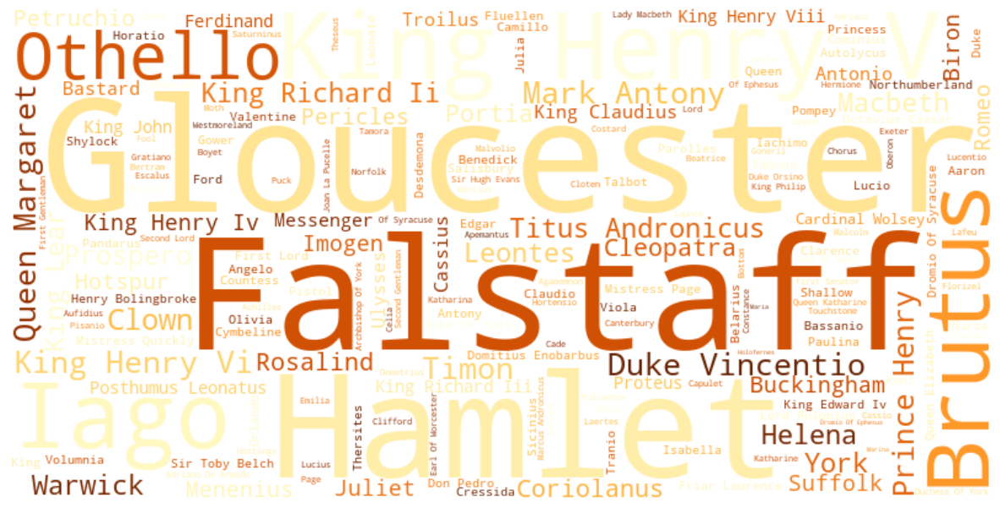

In [19]:
#通过词云图的方式展现总数排名前10的角色
wordcloud = WordCloud(width=800, height=400, colormap='YlOrBr',
                      background_color='white').generate_from_frequencies(character_counts)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [20]:
from gensim.models import Word2Vec

In [21]:
#导入spacy中en_core_web_sm模型完成后续英文文本的预处理
!pip install spacy
import spacy
nlp=spacy.load('en_core_web_sm')


[notice] A new release of pip available: 22.2.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [22]:
shakespeare=pd.read_excel("shakespeare.xlsx")
sex=pd.read_excel("sex.xlsx")
data=shakespeare.merge(sex,on='character',how='left')
data['sex']=data['sex'].fillna('male')
texts=data.groupby(['play_name','genre','act','character','sex'])['text'].apply(lambda x:' '.join(x))

In [23]:
texts=pd.DataFrame(texts)
texts

text
play_name                 genre  act character        sex                                                      
A Midsummer Night's Dream Comedy 1   All              male              That would hang us, every mother's son.
                                     Bottom           male    You were best to call them generally, man by m...
                                     Demetrius        male    Relent, sweet Hermia: and, Lysander, yield Thy...
                                     Egeus            male    Happy be Theseus, our renowned duke! Full of v...
                                     Flute            male    Here, Peter Quince. What is Thisby? a wanderin...
...                                                                                                         ...
Winter's Tale             Comedy 5   Perdita          female  O my poor father! The heaven sets spies upon u...
                                     Polixenes        male    O, not by much. Dear my brother, Let him that ...
                                     Second Gentleman male    Nothing but bonfires: the oracle is fulfilled;...
                                     Shepherd         male    Come, boy; I am past moe children, but thy son...
                                     Third Gentleman  male    Most true, if ever truth were pregnant by circ...

[2690 rows x 1 columns]

In [24]:
#去除英文文本中的停用词和标点符号
def base_lemmatization(text,remove_stop_words=True):
    doc=nlp(text)
    if remove_stop_words:
        return ' '.join([word.lemma_ for word in doc if not word.is_stop and not word.is_punct])
    else:
        return ' '.join([word.lemma_ for word in doc])

In [25]:
#通过循环遍历方法依次完成索引在40-50的英文文本预处理
text_length=50
for i in range(40,50):
    test_text=texts['text'][i][:text_length].ljust(text_length)
    lemmatized=base_lemmatization(test_text).ljust(text_length)
    print(lemmatized)

Peaseblossom scratch head Peaseblossom            
ready                                             
lord fair Helen tell stealth t                    
lord daughter asleep                              
come play mar go n                                
methink find Demetrius like jew                   
methink thing parted eye                          
Hercules Cadmus woo                               
Pardon lord lord shall reply amazedly             
ready                                             


C:\Users\1\AppData\Local\Temp\ipykernel_1880\3872547510.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  test_text=texts['text'][i][:text_length].ljust(text_length)


In [26]:
#采用nlp.pipe的方法对莎士比亚剧作中所有台词英文文本完成预处理
def processing_text(text,batch_size=100,n_process=3):
    return [' '.join([word.lemma_ for word in doc if not word.is_stop and not word.is_punct]) 
            for doc in nlp.pipe(text,batch_size=batch_size,n_process=n_process)]

In [27]:
texts['lem_text']=processing_text(texts['text'].tolist())
texts

text  \
play_name                 genre  act character        sex                                                         
A Midsummer Night's Dream Comedy 1   All              male              That would hang us, every mother's son.   
                                     Bottom           male    You were best to call them generally, man by m...   
                                     Demetrius        male    Relent, sweet Hermia: and, Lysander, yield Thy...   
                                     Egeus            male    Happy be Theseus, our renowned duke! Full of v...   
                                     Flute            male    Here, Peter Quince. What is Thisby? a wanderin...   
...                                                                                                         ...   
Winter's Tale             Comedy 5   Perdita          female  O my poor father! The heaven sets spies upon u...   
                                     Polixenes        male    O, not by much. Dear my brother, Let him that ...   
                                     Second Gentleman male    Nothing but bonfires: the oracle is fulfilled;...   
                                     Shepherd         male    Come, boy; I am past moe children, but thy son...   
                                     Third Gentleman  male    Most true, if ever truth were pregnant by circ...   

                                                                                                       lem_text  
play_name                 genre  act character        sex                                                        
A Midsummer Night's Dream Comedy 1   All              male                                      hang mother son  
                                     Bottom           male    good generally man man accord scrip good Peter...  
                                     Demetrius        male    Relent sweet Hermia Lysander yield Thy craze t...  
                                     Egeus            male    happy Theseus renowned duke vexation come comp...  
                                     Flute            male    Peter Quince Thisby wandering knight Nay faith...  
...                                                                                                         ...  
Winter's Tale             Comedy 5   Perdita          female  o poor father heaven set spy contract celebrat...  
                                     Polixenes        male    o dear brother let cause power grief piece mas...  
                                     Second Gentleman male    bonfire oracle fulfil king daughter find deal ...  
                                     Shepherd         male    come boy past moe child thy son daughter gentl...  
                                     Third Gentleman  male    true truth pregnant circumstance hear swear un...  

[2690 rows x 2 columns]

In [28]:
#采用TF-IDF方法词向量化英文文本
vectorizer=TfidfVectorizer()
X=vectorizer.fit_transform(texts['lem_text'])
df_tfidf=pd.DataFrame(X.todense(),columns=vectorizer.get_feature_names_out())
df_tfidf

,10,2d,2s,4d,5s,6d,8d,aaron,abaissiez,abandon,...,zenelophon,zenith,zephyr,zir,zo,zodiac,zone,zound,zounds,zwaggere
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2685,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2686,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2687,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2688,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [29]:
#采用Word2Vec词向量化英文文本
tokenized_sentences = [sentence.split() for sentence in texts['lem_text']]
#print(tokenized_sentences)
# 使用Word2Vec训练词向量模型
model = Word2Vec(tokenized_sentences, vector_size=100, window=5, min_count=1, workers=4)
# 获取单词向量
word_vectors = model.wv
print("词向量 'abandon'：", word_vectors['abandon'])

词向量 'abandon'： [-0.04776855  0.06673606 -0.02536197  0.01415556 -0.01456134 -0.08462671
  0.02626905  0.11531998 -0.03285514 -0.01579371 -0.02292977 -0.0644832
  0.01320945  0.00426268 -0.00150073 -0.02545533  0.01433184 -0.08590326
  0.0235457  -0.08810534  0.01190215 -0.00197844  0.05025171 -0.02601992
  0.00319501 -0.03685838 -0.04934308 -0.03874172 -0.04237756 -0.03582024
  0.08068359 -0.00837768  0.00612674 -0.00801837 -0.02707053  0.03994776
 -0.00334123 -0.01711324 -0.02093987 -0.09064204  0.01499453 -0.0573374
 -0.04420263 -0.0046502   0.00317856  0.00689258 -0.05045639  0.0247532
 -0.00463157  0.04066248  0.01798981 -0.03519451 -0.04655658 -0.03098601
 -0.0110085   0.0464411   0.05508289  0.02204385 -0.0541481   0.00361873
 -0.01611217  0.00460188 -0.01451252  0.02238388 -0.07571054  0.02730223
  0.01852522  0.01955676 -0.02787693  0.06397662 -0.03272155  0.02107873
  0.04183936 -0.02165613  0.03733387 -0.00248216 -0.01088477 -0.00270629
 -0.03286617  0.01427811 -0.04187768 -0

In [30]:
# word2vec构建文档向量
def get_word2vec_vec(content=None):
    text_vec = np.zeros((len(content), 100))
    for ind, text in enumerate(content):
        wlen = len(text)
        vec = np.zeros((1, 100))
        for w in text:
            try:
                vec += word_vectors[w]
            except:
                pass
        text_vec[ind] = vec/wlen
    word2vec = pd.DataFrame(data=text_vec)
    word2vec.to_csv('word2vec.csv', index=False)
    return text_vec
tokenized_sentences = [sentence.split() for sentence in texts['lem_text']]   
word2vec = get_word2vec_vec(tokenized_sentences)
word2vec

C:\Users\1\AppData\Local\Temp\ipykernel_1880\4119041405.py:12: RuntimeWarning: invalid value encountered in divide
  text_vec[ind] = vec/wlen


array([[-0.66538777,  0.74698969, -0.29408881, ..., -0.95017793,
        -0.02382145, -0.30956157],
       [-0.36454539,  0.5004716 , -0.16142881, ..., -0.5284887 ,
         0.01303651, -0.08399152],
       [-0.42690299,  0.48740605, -0.16852724, ..., -0.59273019,
        -0.00376598, -0.1240274 ],
       ...,
       [-0.38412563,  0.54857991, -0.1735553 , ..., -0.58074357,
         0.01150761, -0.09140897],
       [-0.64641659,  0.66333865, -0.21871883, ..., -0.85343289,
         0.0067329 , -0.23577217],
       [-0.40983314,  0.52263974, -0.18180273, ..., -0.60426901,
        -0.00624671, -0.09743932]])

In [31]:
#采用PCA将向量化的英文数据降维成15维
def get_pca(data,n_components=3,plot=True):
    pca=PCA(n_components=n_components)
    pca.fit(data)
    pca_fit=pca.transform(data)
    if plot:
        plt.figure(figsize=(7.5,5))
        explained_variance_percent=pca.explained_variance_ratio_*100
        plt.bar(range(1,len(pca.explained_variance_)+1),pca.explained_variance_,color='C9',label='explained_variance_ratio')
        plt.title("PCA Barplot -Explained Variance")
        plt.ylabel("Explained Variance")
        plt.xlabel("Nunmber of components")
        plt.xticks(range(1,len(pca.explained_variance_)+1))
        plt.grid(alpha=0.25)
        for i,explained_var in enumerate(explained_variance_percent):
            plt.text(i+1,pca.explained_variance_[i],f'{explained_var:.2f}%',fontsize=7,ha='center',va='bottom')
    return pca,pca_fit

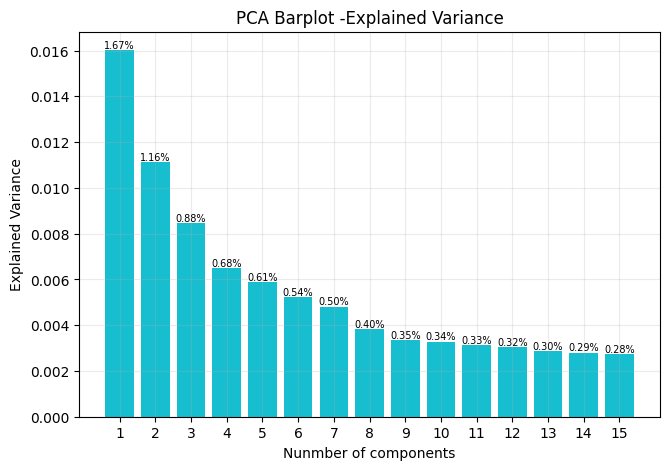

In [32]:
pca,pca_ifidf=get_pca(df_tfidf,n_components=15)

In [33]:
word2vec=pd.DataFrame(word2vec).fillna(0)

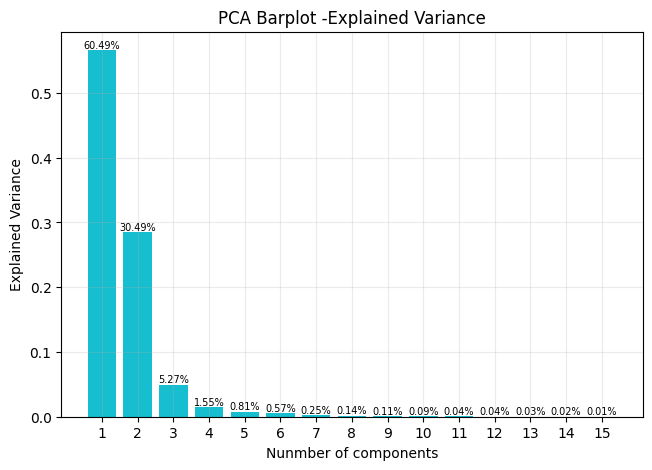

In [34]:
pca,pca_word2vec=get_pca(word2vec,n_components=15)

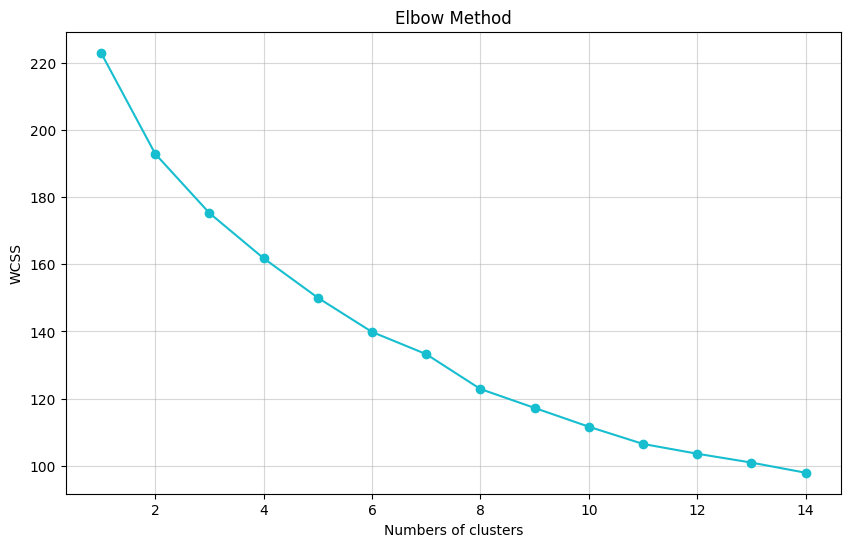

In [35]:
#肘部法判断最优聚类簇
wcss=[]
for i in range(1,15):
    kmeans=KMeans(n_clusters=i,init='k-means++',max_iter=200,n_init=10,random_state=0)
    kmeans.fit(pca_ifidf)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(10,6))
plt.plot(range(1,15),wcss,'C9-o')
plt.title('Elbow Method')
plt.xlabel('Numbers of clusters')
plt.ylabel('WCSS')
plt.grid(alpha=0.5)
plt.show()

In [36]:
#将英文文本聚类为6类
kmeans = KMeans(n_clusters=6, init='k-means++', max_iter=300, n_init=10, random_state=0)
cluster_labels = kmeans.fit_predict(pca_ifidf)

In [37]:
#统计每类所包含的台词总数
texts['k_means_cluster'] = cluster_labels
texts['k_means_cluster'].value_counts()

k_means_cluster
2    1137
0     644
3     436
5     246
4     167
1      60
Name: count, dtype: int64

In [38]:
texts=texts.reset_index()

In [39]:
texts['genre_sex'] = [f'{genre}: {sex}' for sex, genre in zip(texts['sex'], texts['genre'])]

In [40]:
male_data = pca_ifidf[texts['sex'] == 'male']
female_data = pca_ifidf[texts['sex'] == 'female']

In [41]:
!pip install seaborn
import seaborn as sns


[notice] A new release of pip available: 22.2.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [42]:
male_data

array([[-0.05644232, -0.06745907, -0.06824454, ...,  0.1383026 ,
         0.09231041, -0.08134439],
       [-0.023908  , -0.04749618, -0.02265457, ..., -0.01020738,
        -0.03173118, -0.00859413],
       [-0.04510396, -0.05754853, -0.10561073, ..., -0.02626095,
        -0.02274693,  0.01508379],
       ...,
       [-0.0299249 , -0.05845471,  0.0271384 , ..., -0.0222119 ,
         0.01480802, -0.04377319],
       [ 0.02896761, -0.04672308, -0.04805761, ...,  0.14764937,
         0.08597586, -0.11980871],
       [ 0.04557009, -0.02610235, -0.02904597, ...,  0.01761977,
        -0.00948039, -0.00663526]])

In [43]:
male_data[:,0]

array([-0.05644232, -0.023908  , -0.04510396, ..., -0.0299249 ,
        0.02896761,  0.04557009])

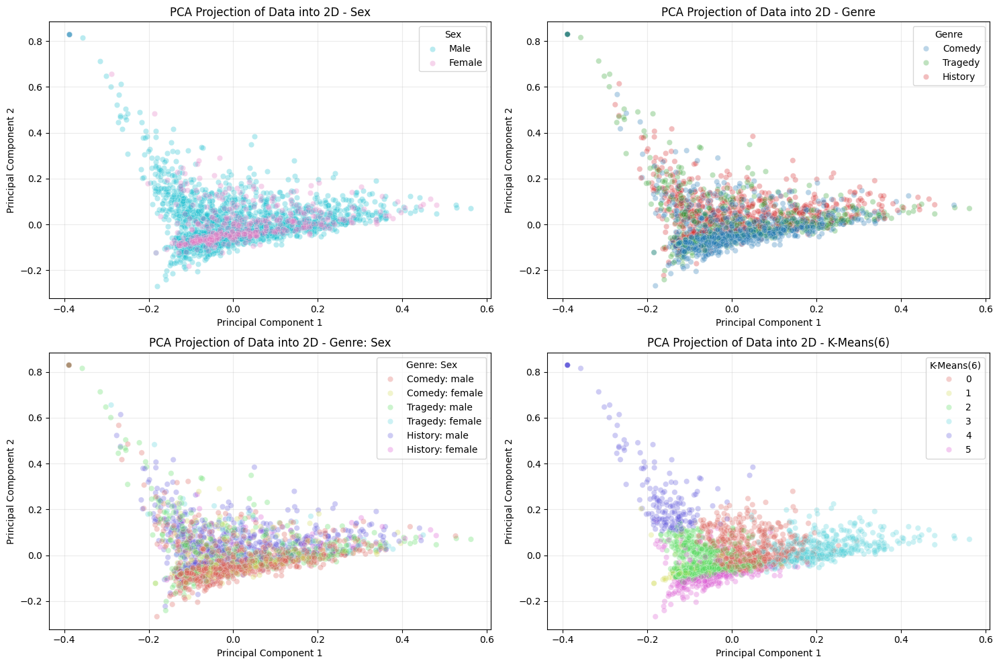

In [44]:
#分类效果可视化呈现
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
ax = ax.flatten()
# 按照性别分类效果
sns.scatterplot(x=male_data[:, 0], y=male_data[:, 1], alpha=0.3, color='C9', label='Male', ax=ax[0])
sns.scatterplot(x=female_data[:, 0], y=female_data[:, 1], alpha=0.3, color='C6', label='Female', ax=ax[0])
ax[0].set_title('PCA Projection of Data into 2D - Sex')
ax[0].set_xlabel('Principal Component 1')
ax[0].set_ylabel('Principal Component 2')
ax[0].legend(title='Sex')
ax[0].grid(alpha=0.25)
# 按照体裁分类效果
sns.scatterplot(x=pca_ifidf[:, 0], y=pca_ifidf[:, 1], alpha=0.3, hue=texts['genre'], palette=['C0', 'C2', 'C3'], ax=ax[1])
ax[1].set_title('PCA Projection of Data into 2D - Genre')
ax[1].set_xlabel('Principal Component 1')
ax[1].set_ylabel('Principal Component 2')
ax[1].legend(title='Genre')
ax[1].grid(alpha=0.25)
# 按照体裁：性别的分类效果
sns.scatterplot(x=pca_ifidf[:, 0], y=pca_ifidf[:, 1], alpha=0.3, hue=texts['genre_sex'], palette=sns.color_palette("hls", 6), ax=ax[2])
ax[2].set_title('PCA Projection of Data into 2D - Genre: Sex')
ax[2].set_xlabel('Principal Component 1')
ax[2].set_ylabel('Principal Component 2')
ax[2].legend(title='Genre: Sex')
ax[2].grid(alpha=0.25)
# 按照K-means聚类结果分类
sns.scatterplot(x=pca_ifidf[:, 0], y=pca_ifidf[:, 1], alpha=0.3, hue=texts['k_means_cluster'], palette=sns.color_palette("hls", 6), ax=ax[3])
ax[3].set_title('PCA Projection of Data into 2D - K-Means(6)')
ax[3].set_xlabel('Principal Component 1')
ax[3].set_ylabel('Principal Component 2')
ax[3].legend(title='K-Means(6)')
ax[3].grid(alpha=0.25)
plt.tight_layout()
plt.show()

In [45]:
import gensim
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
import numpy as np

In [46]:
stopwords=pd.read_excel("stopwords.xlsx",header=None,names=['stopwords'])
stopwords=stopwords['stopwords'].tolist()

In [47]:
new_list=[]
for words in tokenized_sentences:
    list1=[]
    for word in words:
        if word not in stopwords:
            list1.append(word)
    new_list.append(list1)
new_list

[['hang', 'mother', 'son'],
 ['accord',
  'scrip',
  'Peter',
  'Quince',
  'play',
  'treat',
  'read',
  'actor',
  'grow',
  'piece',
  'assure',
  'merry',
  'Peter',
  'Quince',
  'actor',
  'scroll',
  'master',
  'spread',
  'ready',
  'proceed',
  'Pyramus',
  'lover',
  'tyrant',
  'tear',
  'true',
  'performing',
  'audience',
  'eye',
  'storm',
  'condole',
  'measure',
  'rest',
  'chief',
  'humour',
  'tyrant',
  'play',
  'Ercles',
  'rarely',
  'tear',
  'cat',
  'split',
  'rage',
  'rock',
  'shiver',
  'shock',
  'break',
  'lock',
  'prison',
  'gate',
  'Phibbus',
  'car',
  'shine',
  'mar',
  'foolish',
  'Fates',
  'lofty',
  'rest',
  'player',
  'Ercles',
  'vein',
  'tyrant',
  'vein',
  'lover',
  'condoling',
  'hide',
  'play',
  'Thisby',
  'speak',
  'monstrous',
  'voice',
  'thisne',
  'Thisne',
  'Pyramus',
  'lover',
  'dear',
  'thy',
  'Thisby',
  'dear',
  'lady',
  'dear',
  'proceed',
  'play',
  'lion',
  'roar',
  'heart',
  'hear',
  'roar'

In [48]:
# 创建词典和语料库
dictionary = Dictionary(tokenized_sentences)
corpus = [dictionary.doc2bow(doc) for doc in tokenized_sentences]

In [49]:
tokenized_sentences

[['hang', 'mother', 'son'],
 ['good',
  'generally',
  'man',
  'man',
  'accord',
  'scrip',
  'good',
  'Peter',
  'Quince',
  'play',
  'treat',
  'read',
  'name',
  'actor',
  'grow',
  'point',
  'good',
  'piece',
  'work',
  'assure',
  'merry',
  'good',
  'Peter',
  'Quince',
  'forth',
  'actor',
  'scroll',
  'master',
  'spread',
  'ready',
  'proceed',
  'Pyramus',
  'lover',
  'tyrant',
  'ask',
  'tear',
  'true',
  'performing',
  'let',
  'audience',
  'look',
  'eye',
  'storm',
  'condole',
  'measure',
  'rest',
  'chief',
  'humour',
  'tyrant',
  'play',
  'Ercles',
  'rarely',
  'tear',
  'cat',
  'split',
  'rage',
  'rock',
  'shiver',
  'shock',
  'shall',
  'break',
  'lock',
  'prison',
  'gate',
  'Phibbus',
  'car',
  'shall',
  'shine',
  'far',
  'mar',
  'foolish',
  'Fates',
  'lofty',
  'rest',
  'player',
  'Ercles',
  'vein',
  'tyrant',
  'vein',
  'lover',
  'condoling',
  'hide',
  'face',
  'let',
  'play',
  'Thisby',
  'speak',
  'monstrous',

In [55]:
# 遍历寻找最佳主题数
coherence_lda_list=[]
for num_topics in range(1,20):
    passes = 10
    # 训练LDA模型
    lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=passes)
    # 计算主题一致性
    coherence_model_lda = CoherenceModel(model=lda_model, texts=tokenized_sentences, dictionary=dictionary, coherence='c_v')
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_lda_list.append(coherence_lda)
    print(coherence_lda)

0.2773002219224754
0.2684972938302479
0.27953793896580814
0.31718292413592586
0.3004347057849607
0.2936798205731869
0.299749716963199
0.34993303752788446
0.3737267864639579
0.4340295550209051
0.3691407316450561
0.38643285248015896
0.421321723035206
0.42894453847070063
0.43577391750328404
0.42045370604482174
0.43383955459979057
0.4648019977410174
0.4175878786822615


In [78]:
# 遍历寻找最佳主题数
for num_topics in range(20,40):
    passes = 10
    # 训练LDA模型
    lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=passes)
    # 计算主题一致性
    coherence_model_lda = CoherenceModel(model=lda_model, texts=tokenized_sentences, dictionary=dictionary, coherence='c_v')
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_lda_list.append(coherence_lda)
    print(coherence_lda)

0.4263625028790471
0.4200085727656231
0.4051928547552381
0.4621139449943574
0.4595978116086687
0.4591774070807679
0.4430539818622202
0.47762471687629465
0.48633726028636726
0.474601147771735
0.47061519379533706
0.4546402731826646
0.43086825489167346
0.4581545945906396
0.45824390152408445
0.42921737755917533
0.4446447621957666
0.42066908848610557
0.46824415809049463
0.43005096497488976


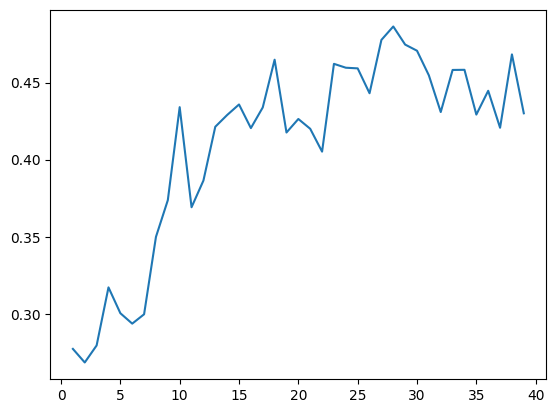

In [80]:
num_topics=[x for x in range(1,40)]
plt.plot(num_topics,coherence_lda_list)

In [81]:
num_topics=18
passes = 10
# 训练LDA模型
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=passes)
# 计算主题一致性
coherence_model_lda = CoherenceModel(model=lda_model, texts=tokenized_sentences, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print(coherence_lda)

0.3974294353880121


In [82]:
# 输出文档与主题矩阵
doc_topic = []
for i in range(len(corpus)):
    doc = corpus[i]
    topic_prob = dict(lda_model.get_document_topics(doc))
    temp = []
    for j in range(num_topics):
        if j in topic_prob:
            temp.append(topic_prob[j])
        else:
            temp.append(0)
    doc_topic.append(temp)
    
doc_topic_df = pd.DataFrame(np.array(doc_topic),columns=[f"Topic_{i+1}" for i in range(num_topics)])
doc_topic_df

,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9,Topic_10,Topic_11,Topic_12,Topic_13,Topic_14,Topic_15,Topic_16,Topic_17,Topic_18
0,0.013890,0.763877,0.013890,0.01389,0.013890,0.01389,0.01389,0.01389,0.013890,0.01389,0.013890,0.013890,0.01389,0.013890,0.01389,0.01389,0.01389,0.013890
1,0.000000,0.000000,0.573355,0.00000,0.000000,0.00000,0.00000,0.00000,0.000000,0.00000,0.000000,0.389582,0.00000,0.000000,0.00000,0.00000,0.00000,0.031971
2,0.186739,0.257883,0.000000,0.00000,0.000000,0.00000,0.00000,0.00000,0.000000,0.00000,0.117712,0.366672,0.00000,0.000000,0.00000,0.00000,0.00000,0.000000
3,0.038352,0.086913,0.000000,0.00000,0.000000,0.00000,0.00000,0.00000,0.025117,0.00000,0.017526,0.825205,0.00000,0.000000,0.00000,0.00000,0.00000,0.000000
4,0.000000,0.000000,0.000000,0.00000,0.414863,0.00000,0.00000,0.00000,0.439768,0.00000,0.000000,0.000000,0.00000,0.000000,0.00000,0.00000,0.00000,0.081226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2685,0.000000,0.000000,0.513346,0.00000,0.128928,0.00000,0.00000,0.00000,0.000000,0.00000,0.000000,0.324362,0.00000,0.000000,0.00000,0.00000,0.00000,0.000000
2686,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.00000,0.00000,0.000000,0.00000,0.000000,0.952744,0.00000,0.000000,0.00000,0.00000,0.00000,0.000000
2687,0.000000,0.000000,0.000000,0.00000,0.295882,0.00000,0.00000,0.00000,0.000000,0.00000,0.000000,0.632290,0.00000,0.056383,0.00000,0.00000,0.00000,0.000000
2688,0.000000,0.267199,0.000000,0.00000,0.692390,0.00000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.00000,0.00000,0.00000,0.000000


In [83]:
# 输出每个文档概率最大的主题
docs = []
for i, doc in enumerate(corpus):
    max_topic = max(lda_model.get_document_topics(doc), key=lambda x: x[1])
    docs.append([i,max_topic[0] + 1])
doc_df = pd.DataFrame(np.array(docs),columns=['文档序号','主题'])
doc_df

,文档序号,主题
0,0,2
1,1,3
2,2,12
3,3,12
4,4,9
...,...,...
2685,2685,3
2686,2686,12
2687,2687,12
2688,2688,5


In [84]:
doc_df['主题'].value_counts()

主题
12    1605
5      402
15     153
3       98
9       57
17      56
10      52
2       51
16      50
14      44
7       40
11      32
4       22
1       17
6        5
18       3
8        2
13       1
Name: count, dtype: int64

In [68]:
# 输出每个主题下概率排名前20的词汇
top_words_per_topic = []
for topic_id in range(num_topics):
    top_words = [dictionary[word_id] for word_id, prob in lda_model.get_topic_terms(topic_id, topn=20)]
    top_words_per_topic.append(top_words)
    
top_words_df = pd.DataFrame(np.array(top_words_per_topic).T,columns=[f"Topic_{i+1}" for i in range(num_topics)])
top_words_df

,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9,Topic_10
0,good,shall,hey,lord,love,de,Padua,Petruchio,thy,thou
1,sir,sir,RICHARD,Lord,o,gar,item,Bianca,thou,thee
2,come,ANTIPHOLUS,c.,king,Silvia,DON,buck,Hortensio,thee,thy
3,lord,good,l'envoy,France,Valentine,dat,aside,Signior,shall,man
4,shall,know,Phebe,grace,Proteus,Rugby,Launce,Gremio,king,come
5,know,let,KING,majesty,Julia,Jack,fault,Katharina,o,shall
6,man,Caesar,III,Duke,Romeo,come,trib,Baptista,lord,love
7,love,time,rye,God,night,vill,lose,Grumio,let,let
8,Sir,speak,cub,man,Cassio,vat,CLARENCE,Minola,son,o
9,let,king,remuneration,England,monster,shall,prayer,suitor,come,good


In [69]:
texts

,play_name,genre,act,character,sex,text,lem_text,k_means_cluster,genre_sex
0,A Midsummer Night's Dream,Comedy,1,All,male,"That would hang us, every mother's son.",hang mother son,2,Comedy: male
1,A Midsummer Night's Dream,Comedy,1,Bottom,male,"You were best to call them generally, man by m...",good generally man man accord scrip good Peter...,2,Comedy: male
2,A Midsummer Night's Dream,Comedy,1,Demetrius,male,"Relent, sweet Hermia: and, Lysander, yield Thy...",Relent sweet Hermia Lysander yield Thy craze t...,2,Comedy: male
3,A Midsummer Night's Dream,Comedy,1,Egeus,male,"Happy be Theseus, our renowned duke! Full of v...",happy Theseus renowned duke vexation come comp...,0,Comedy: male
4,A Midsummer Night's Dream,Comedy,1,Flute,male,"Here, Peter Quince. What is Thisby? a wanderin...",Peter Quince Thisby wandering knight Nay faith...,2,Comedy: male
...,...,...,...,...,...,...,...,...,...
2685,Winter's Tale,Comedy,5,Perdita,female,O my poor father! The heaven sets spies upon u...,o poor father heaven set spy contract celebrat...,2,Comedy: female
2686,Winter's Tale,Comedy,5,Polixenes,male,"O, not by much. Dear my brother, Let him that ...",o dear brother let cause power grief piece mas...,2,Comedy: male
2687,Winter's Tale,Comedy,5,Second Gentleman,male,Nothing but bonfires: the oracle is fulfilled;...,bonfire oracle fulfil king daughter find deal ...,2,Comedy: male
2688,Winter's Tale,Comedy,5,Shepherd,male,"Come, boy; I am past moe children, but thy son...",come boy past moe child thy son daughter gentl...,2,Comedy: male


In [70]:
texts['genre'].drop_duplicates()

0       Comedy
135    Tragedy
557    History
Name: genre, dtype: object

In [71]:
Comedy_texts=texts[texts['genre']=='Comedy']['lem_text']
Tragedy_texts=texts[texts['genre']=='Tragedy']['lem_text']
History_texts=texts[texts['genre']=='History']['lem_text']

In [72]:
Comedy_texts=[' '.join(Comedy_texts.tolist())]
Tragedy_texts=[' '.join(Tragedy_texts.tolist())]
History_texts=[' '.join(History_texts.tolist())]
documents = {'Comedy': Comedy_texts, 'Tragedy': Tragedy_texts, 'History': History_texts} 

In [73]:
!pip install textblob


[notice] A new release of pip available: 22.2.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [74]:
from textblob import TextBlob 

In [75]:
documents = {'Comedy': Comedy_texts, 'Tragedy': Tragedy_texts, 'History': History_texts}   
# 计算每类剧作的情感值（平均情感值）  
for kind, texts in documents.items():  
    polarity_sum = 0  
    count = 0  
    for text in texts:  
        blob = TextBlob(text)  
        polarity_sum += blob.sentiment.polarity  
        count += 1  
    average_polarity = polarity_sum / count if count > 0 else 0  
    print(f"{kind}类型文本的平均情感值为：{average_polarity}")

Comedy类型文本的平均情感值为：0.1729832479452672
Tragedy类型文本的平均情感值为：0.13755755411160756
History类型文本的平均情感值为：0.11672590114649149


In [76]:
df_dict = pd.read_table(r"AFINN-111.txt", sep="\t", names=['key', 'score'])
key = df_dict['key'].values.tolist()
score = df_dict['score'].values.tolist()
df_dict.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2477 entries, 0 to 2476
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     2477 non-null   object
 1   score   2477 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 38.8+ KB


In [77]:
# 计算每篇文档的情感值
for kind, texts in documents.items():
    for text in texts:
        cut=text.split()
        score_list = [score[key.index(x)] for x in cut if(x in key)]
        all_score=sum(score_list)
        print(f" {kind} 类型文本的平均情感值为：{all_score/len(score_list)}")

 Comedy 类型文本的平均情感值为：0.4994898167421738
 Tragedy 类型文本的平均情感值为：0.2663939286137792
 History 类型文本的平均情感值为：0.22686313403230376
